In [1]:
import os
import yaml
import tqdm

import ase
from ase import io
from ase import data
from ase import db
from ase.visualize.plot import plot_atoms

from skimage import feature
import numpy as np

import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt

import ml_collections
from clu import checkpoint


from molnet import utils, train_state, train
from molnet.data import input_pipeline_water
from molnet.models import create_model
from configs import root_dirs
from analyses import make_predictions

from typing import Tuple

INDEX_TO_SYMBOL = {
    0: 'H',
    1: 'O',
}

2025-02-25 09:56:34.922060: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
workdir = "/u/79/kurkil1/unix/work/molnet/runs/bf16-centercrop-fix-water-adam-3e-4-z15-gx5-8afm/"

#workdir = "/u/79/kurkil1/unix/work/molnet/runs/bf16-centercrop-fix-water-adam-3e-4-z15-gx5-att32/"
#workdir = "/u/79/kurkil1/unix/work/molnet/runs/bf16-augs-rebias-adam-3e-4-z10-reverse-z/"
#workdir = "/Users/kurkil1/work/molnet/runs/attention-adam-3e-4/"

In [3]:
def load_from_workdir(
    workdir: str,
    return_attention: bool
):
    # Load the model config
    with open(os.path.join(workdir, "config.yaml"), "rt") as f:
        config = yaml.unsafe_load(f)
    config = ml_collections.ConfigDict(config)
    config.root_dir = root_dirs.get_root_dir("afms_rebias")
    config.model.return_attention_maps = return_attention

    print(config)

    # Create the model
    model = create_model(config.model)

    checkpoint_dir = os.path.join(workdir, "checkpoints")
    ckpt = checkpoint.Checkpoint(checkpoint_dir)

    apply_fn = model.apply
    tx = utils.create_optimizer(config)
    restored_state = ckpt.restore(state=None)['state']

    # Load the model state
    state = train_state.EvaluationState.create(
        apply_fn=apply_fn,
        params=restored_state['params'],
        batch_stats=restored_state['batch_stats'],
        tx=tx,
    )
    state = jax.tree_util.tree_map(jnp.asarray, state)

    return state, config

In [4]:
state, config = load_from_workdir(
    workdir=workdir,
    return_attention=True
)

batch_size: 8
cutout_probs:
- 0.5
- 0.3
- 0.1
- 0.05
- 0.05
dataset: water-bilayer-tf
debug: false
eval_every_steps: 2000
gaussian_factor: 5.0
interpolate_input_z: 16
learning_rate: 0.0003
learning_rate_schedule: constant
learning_rate_schedule_kwargs:
  decay_steps: 50000
  init_value: 0.0003
  peak_value: 0.0006
  warmup_steps: 2000
log_every_steps: 100
loss_fn: mse
max_atoms: 54
max_shift_per_slice: 0.02
model:
  attention_activation: sigmoid
  attention_channels:
  - 16
  - 16
  - 32
  - 32
  - 32
  conv_activation: relu
  decoder_channels:
  - 256
  - 128
  - 64
  - 32
  - 16
  decoder_kernel_size:
  - - 3
    - 3
    - 3
  - - 3
    - 3
    - 3
  - - 3
    - 3
    - 3
  - - 3
    - 3
    - 3
  - - 3
    - 3
    - 3
  dtype: bfloat16
  encoder_channels:
  - 16
  - 32
  - 64
  - 128
  - 256
  encoder_kernel_size:
  - - 3
    - 3
    - 3
  - - 3
    - 3
    - 3
  - - 3
    - 3
    - 3
  - - 3
    - 3
    - 3
  - - 3
    - 3
    - 3
  model_name: Attention-UNet
  output_activation: n

2025-02-25 09:56:56.358356: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1960] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [5]:
rng = jax.random.PRNGKey(0)
datarng, rng = jax.random.split(rng)
with config.unlocked():
    #config.z_cutoff = 0.8
    #config.interpolate_z = 16
    #config.target_z_cutoff = 1.6
    #config.train_molecules = (0, 80000)
    #config.val_molecules = (80000, 100000)
    #config.max_shift_per_slice = 0.02
    config.root_dir = "/u/79/kurkil1/unix/work/molnet/data/water-bilayer-tf"

ds = input_pipeline_water.get_datasets(
    config
)['val']

batch = next(ds)

for k, v in batch.items():
    print(k, v.shape)

[libprotobuf ERROR external/com_google_protobuf/src/google/protobuf/text_format.cc:337] Error parsing text-format tensorflow.data.experimental.DistributedSnapshotMetadata: 1:1: Invalid control characters encountered in text.
[libprotobuf ERROR external/com_google_protobuf/src/google/protobuf/text_format.cc:337] Error parsing text-format tensorflow.data.experimental.DistributedSnapshotMetadata: 1:3: Expected identifier, got: 8878535636954457044
[libprotobuf ERROR external/com_google_protobuf/src/google/protobuf/text_format.cc:337] Error parsing text-format tensorflow.data.experimental.DistributedSnapshotMetadata: 1:1: Invalid control characters encountered in text.
[libprotobuf ERROR external/com_google_protobuf/src/google/protobuf/text_format.cc:337] Error parsing text-format tensorflow.data.experimental.DistributedSnapshotMetadata: 1:3: Expected identifier, got: 12321035707558538250


images (8, 128, 128, 16, 1)
atom_map (8, 128, 128, 16, 2)
xyz (8, 500, 5)
sw (8, 2, 3)


In [12]:
def grid_to_mol(
    grid: jnp.ndarray,
    peak_threshold: float = 0.5,
    z_cutoff: float = 1.0,
) -> ase.Atoms:
    grid = grid[..., ::-1, :]

    peaks = feature.peak_local_max(
        grid,
        min_distance=5,
        exclude_border=0,
        threshold_rel=peak_threshold
    )

    xyz_from_peaks = peaks[:, [1, 0, 2]] * (.125, .125, .1)
    elem_from_peaks = peaks[:, 3]

    mol = ase.Atoms(
        positions=xyz_from_peaks,
        symbols=[INDEX_TO_SYMBOL[i] for i in elem_from_peaks],
        #cell=[16, 16, 0],
    )
    mol.positions[:, 2] -= mol.get_positions()[:, 2].max() - z_cutoff
    return mol

def grid_to_mol_v2(
    grid: jnp.ndarray,
    peak_threshold: float = 0.5,
    z_cutoff: float = 1.0,
) -> ase.Atoms:
    grid = grid[..., ::-1, :]
    #transpose second and third axis
    grid = grid.transpose(1, 0, 2, 3)

    o_peaks = feature.peak_local_max(
        grid[..., 1],
        #min_distance=10,
        exclude_border=0,
        threshold_rel=peak_threshold
    )
    h_peaks = feature.peak_local_max(
        grid[..., 0],
        #min_distance=10,
        exclude_border=0,
        threshold_rel=peak_threshold
    )

    o_pos = o_peaks[:, [1, 0, 2]] * (.125, .125, .1)
    mol_o = ase.Atoms(
        positions=o_pos,
        symbols=['O'] * len(o_pos),
    )
    #mol_o.positions[:, 2] -= mol_o.get_positions()[:, 2].max() - z_cutoff

    h_pos = h_peaks[:, [1, 0, 2]] * (.125, .125, .1)
    mol_h = ase.Atoms(
        positions=h_pos,
        symbols=['H'] * len(h_peaks),
    )
    full_molecule = mol_o + mol_h


    return mol_o, mol_h, full_molecule

In [7]:
@jax.jit
def predict(
    state,
    batch,
):
    inputs, targets = batch['images'], batch['atom_map']
    preds, attentions = state.apply_fn(
        {'params': state.params, 'batch_stats': state.batch_stats},
        inputs,
        training=False,
    )
    return inputs, targets, preds, attentions, batch["xyz"]

In [11]:
batch = next(ds)

In [36]:
inputs, targets, preds, attentions, xyz = predict(state, batch)

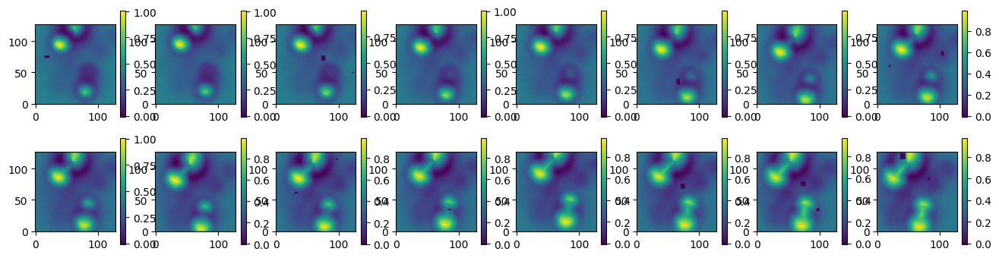

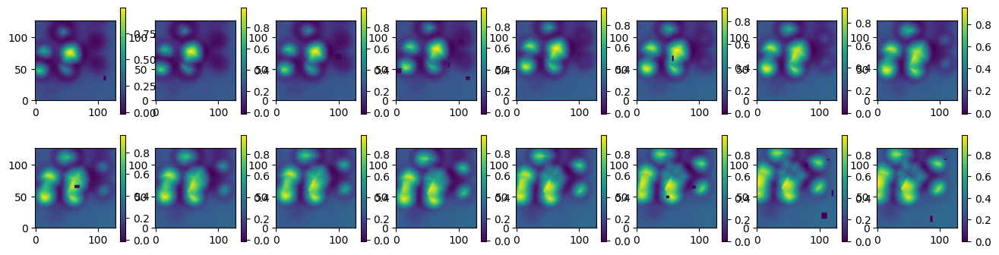

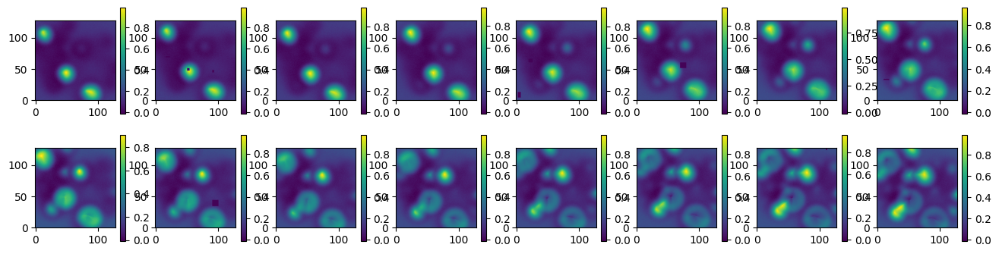

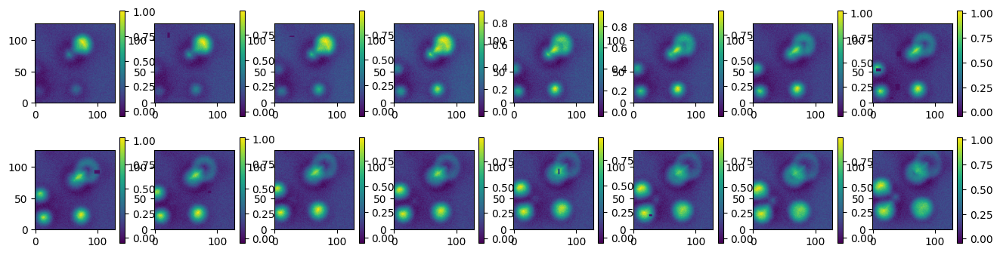

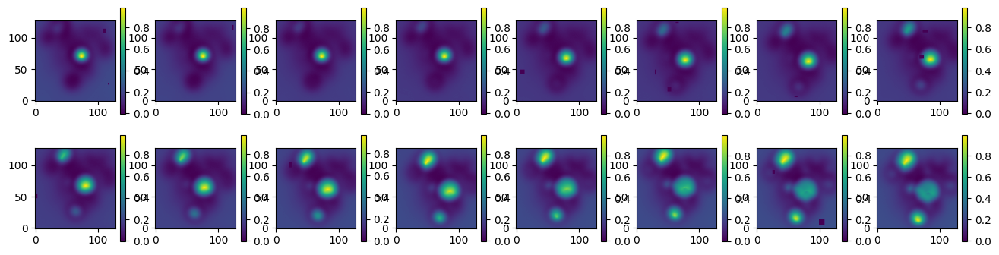

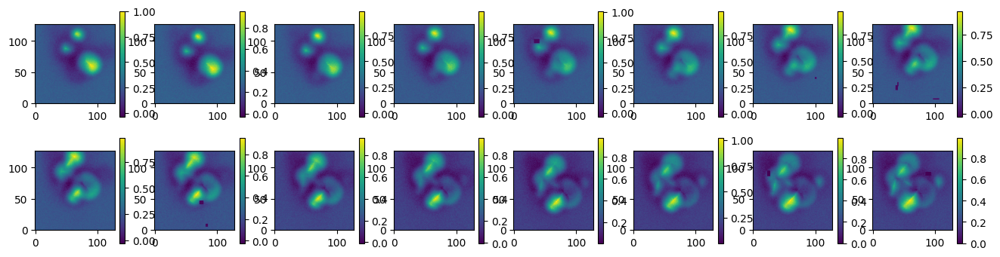

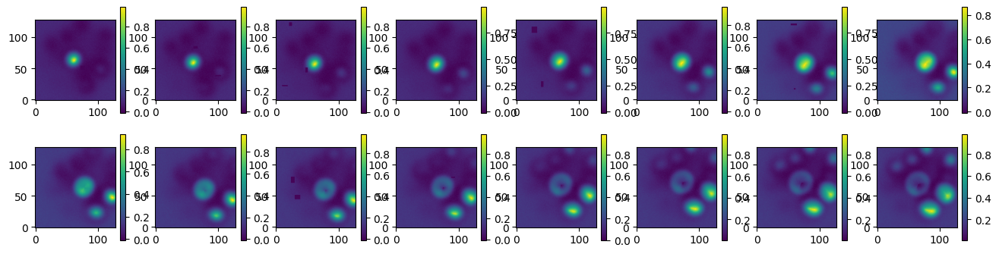

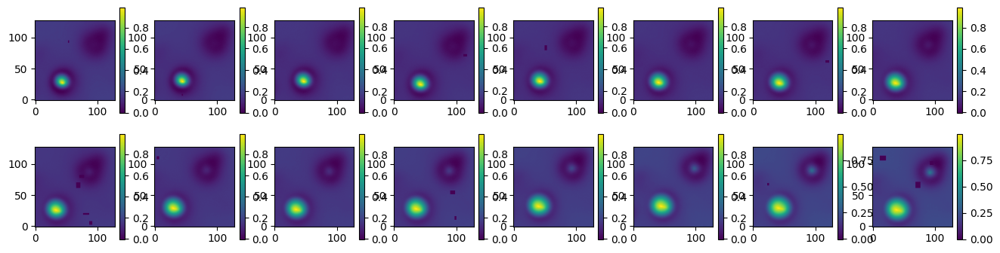

In [37]:
for i in range(inputs.shape[0]):
    fig = plt.figure(figsize=(16, 4))
    for z in range(preds.shape[-2]):
        ax = plt.subplot(2, 8, z+1)
        im = ax.imshow(inputs[i, ..., z, 0], origin='lower')
        plt.colorbar(im, ax=ax)

    plt.show()

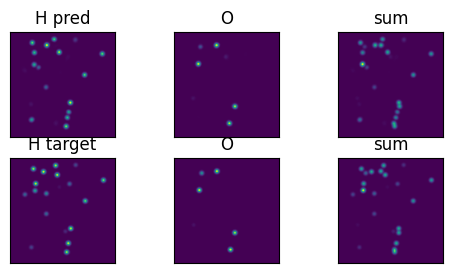

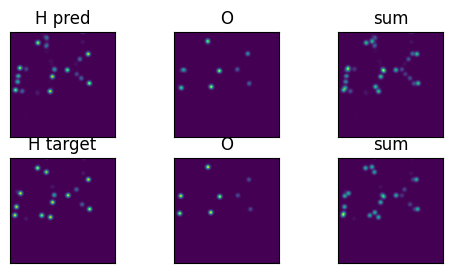

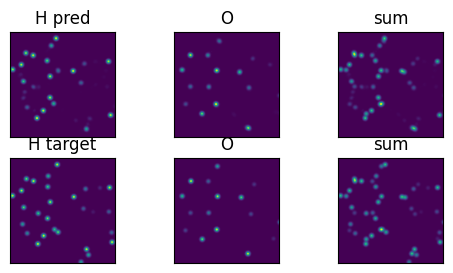

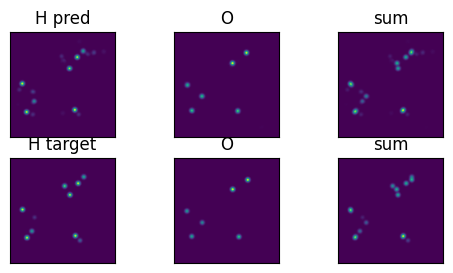

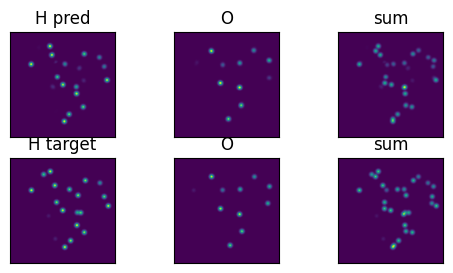

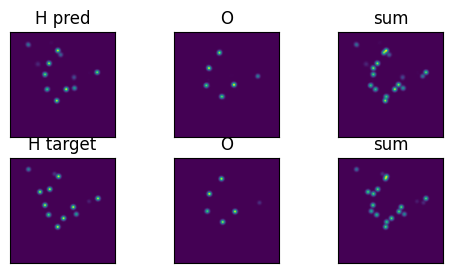

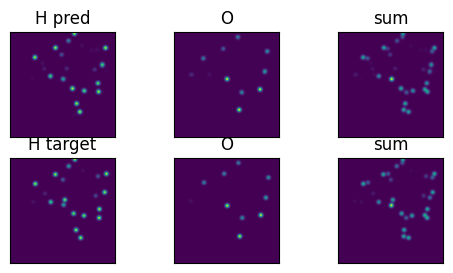

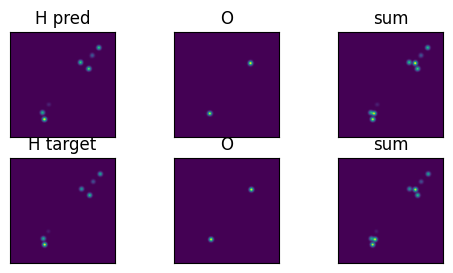

In [14]:
labels = ["H", "O"]

for i in range(inputs.shape[0]):

    # columns H, O, sum
    fig, (ax_pred, ax_target) = plt.subplots(2, 3, figsize=(6, 3))

    for (ax, tensor, label) in zip(
        (ax_pred, ax_target),
        (preds, targets),
        ("pred", "target")
    ):

        ax[0].imshow(tensor[i, ..., 0].sum(axis=-1), origin='lower')
        ax[0].set_xticks([])
        ax[0].set_yticks([])
        ax[0].set_title(f"H {label}")

        ax[1].imshow(tensor[i, ..., 1].sum(axis=-1), origin='lower')
        ax[1].set_xticks([])
        ax[1].set_yticks([])
        ax[1].set_title("O")

        ax[2].imshow(tensor[i].sum(axis=(-2,-1)), origin='lower')
        ax[2].set_xticks([])
        ax[2].set_yticks([])
        ax[2].set_title("sum")


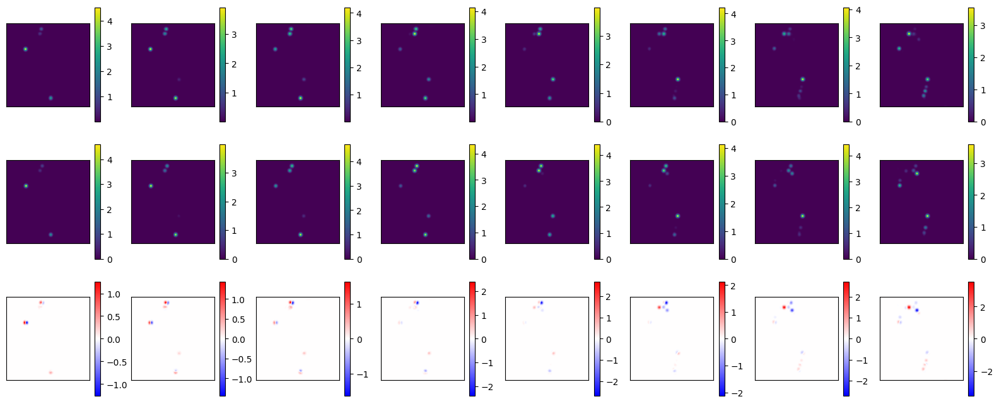

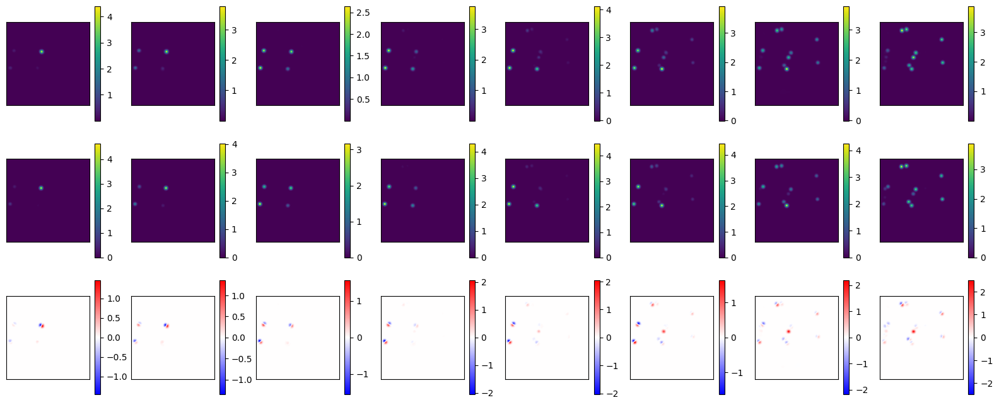

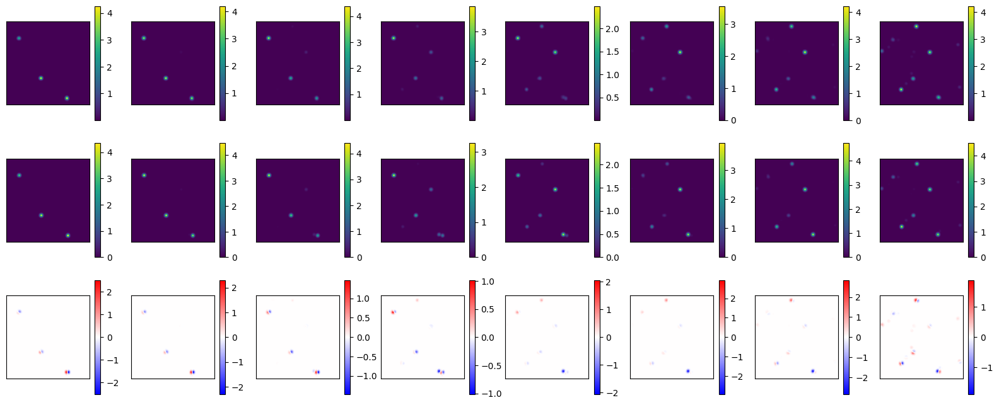

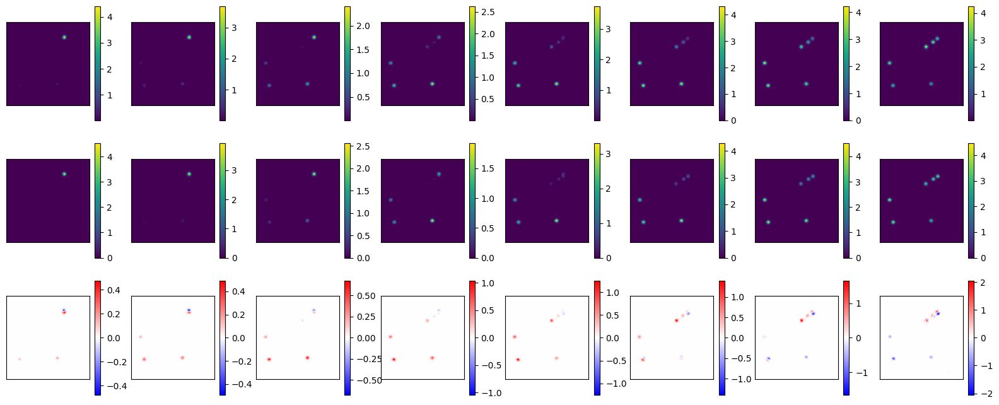

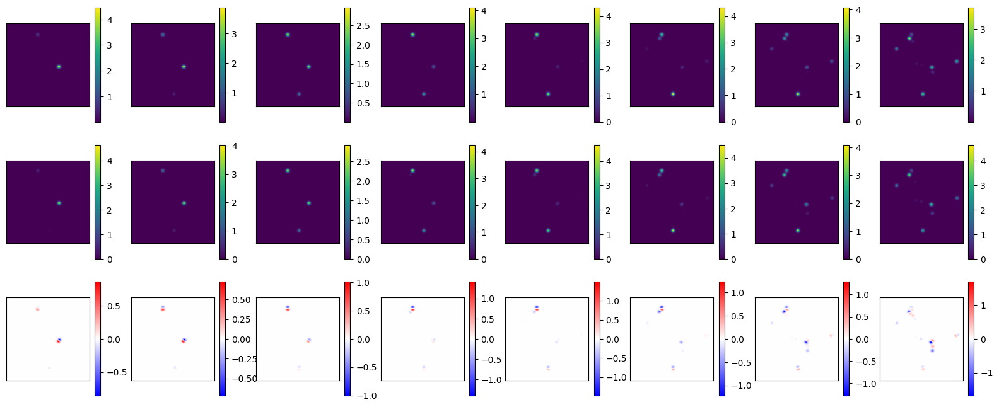

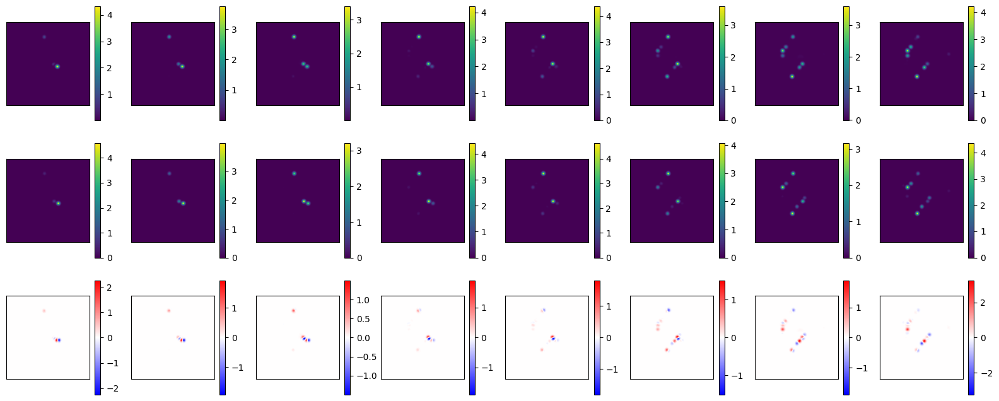

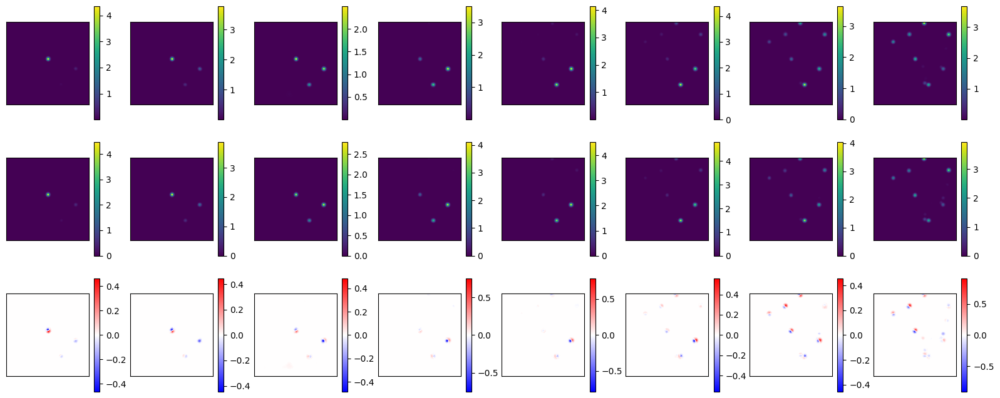

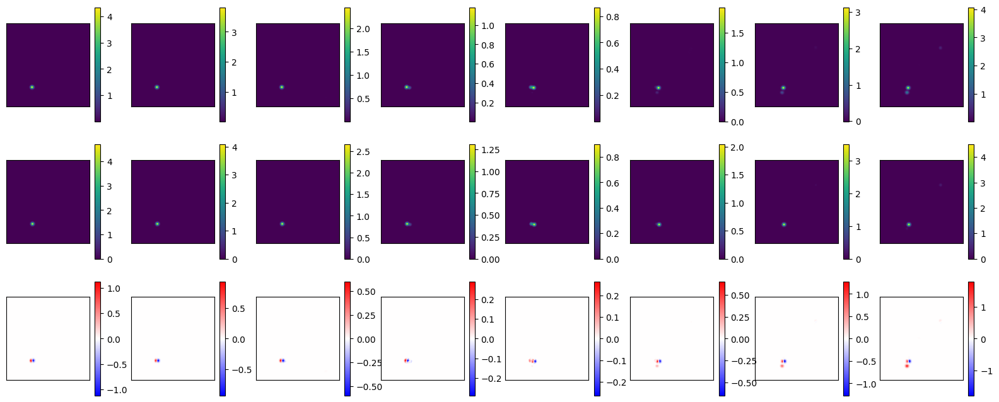

In [15]:
# preds, targets are shape (batch, x, y, z, channels)
# Plot the sum of the channels for each z slice for preds, targets and difference

diff = preds - targets
for i in range(inputs.shape[0]):

    # ncols = z
    # nrows = 3 (pred, target, diff)

    fig, axs = plt.subplots(3, preds.shape[-2]//2, figsize=(20, 8))

    for z in range(preds.shape[-2]//2):
        for j, (tensor, title, cmap) in enumerate(
            ((preds, "pred", "viridis"), (targets, "target", "viridis"), (diff, "diff", "bwr"))
        ):
            # Make diff symmetric
            if title == "diff":
                vmin = -np.abs(tensor[i, ..., z, :].sum(axis=-1)).max()
                vmax = np.abs(tensor[i, ..., z, :].sum(axis=-1)).max()
            else:
                vmin = None
                vmax = None
            im = axs[j, z].imshow(tensor[i, ..., z, :].sum(axis=-1), origin='lower', cmap=cmap, vmin=vmin, vmax=vmax)
            # plot color bar for diff
            plt.colorbar(im, ax=axs[j, z])
            axs[j, z].set_xticks([])
            axs[j, z].set_yticks([])
            #axs[j, z].set_title(f"{title} {z}")

    plt.show()

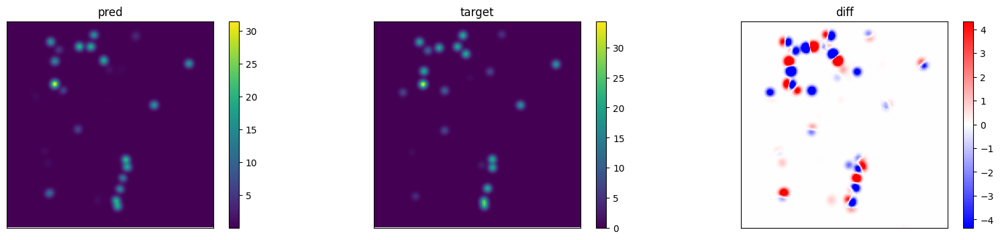

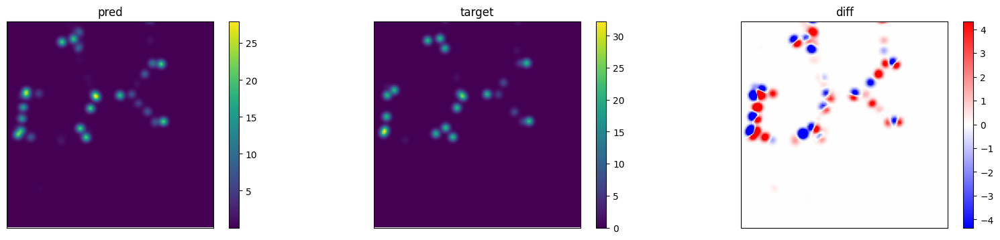

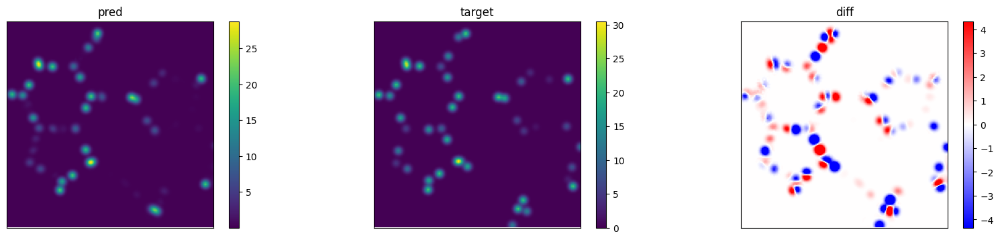

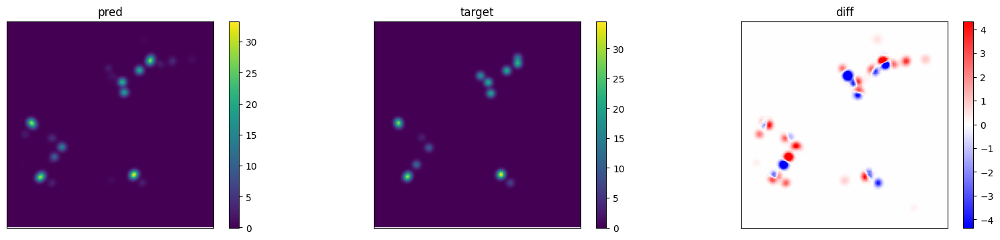

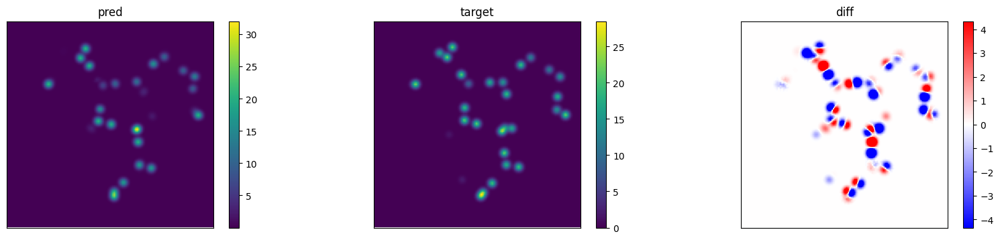

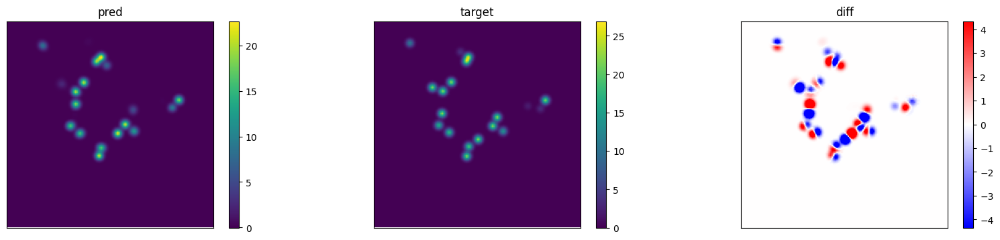

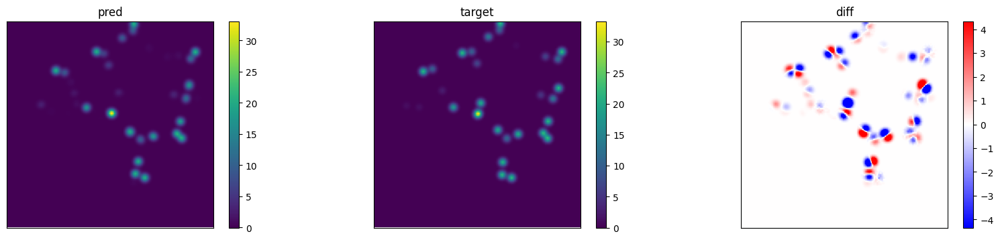

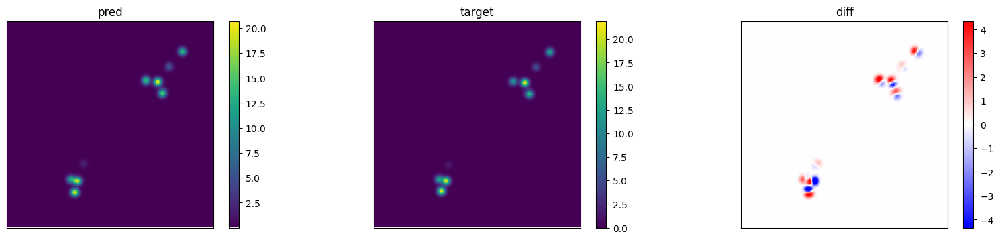

In [16]:
# preds, targets are shape (batch, x, y, z, channels)
# Plot the sum of the channels and zs for preds, targets and difference

diff = preds - targets
for i in range(inputs.shape[0]):

    # ncols = 3 (pred, target, diff)

    fig, axs = plt.subplots(1, 3, figsize=(20, 4))

    for j, (tensor, title, cmap) in enumerate(
        ((preds, "pred", "viridis"), (targets, "target", "viridis"), (diff, "diff", "bwr"))
    ):
        # Make diff symmetric
        if title == "diff":
            vmin = -diff.max()
            vmax = diff.max()
        else:
            vmin = None
            vmax = None
        im = axs[j].imshow(tensor[i, ..., :].sum(axis=-1).sum(axis=-1), origin='lower', cmap=cmap, vmin=vmin, vmax=vmax)
        # plot color bar for diff
        plt.colorbar(im, ax=axs[j])
        axs[j].set_xticks([])
        axs[j].set_yticks([])
        axs[j].set_title(f"{title}")

    plt.show()


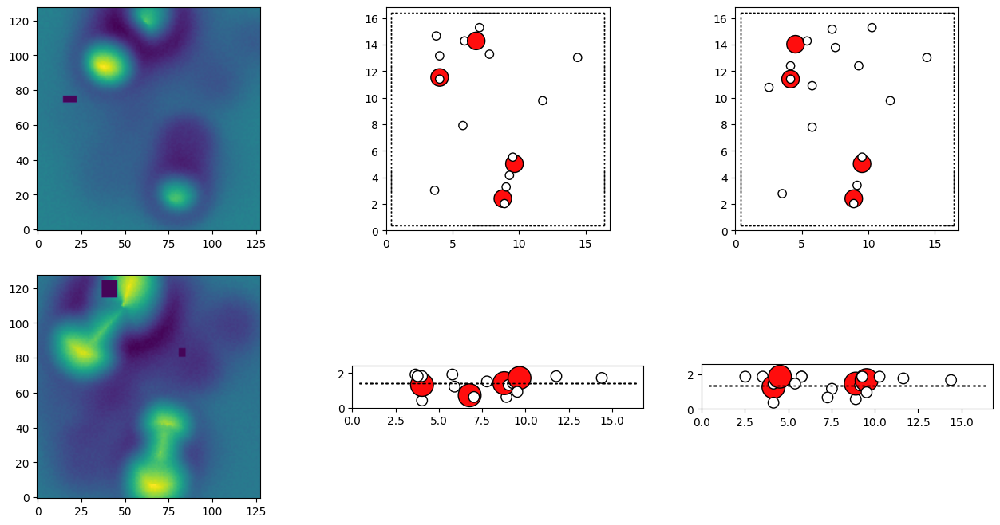

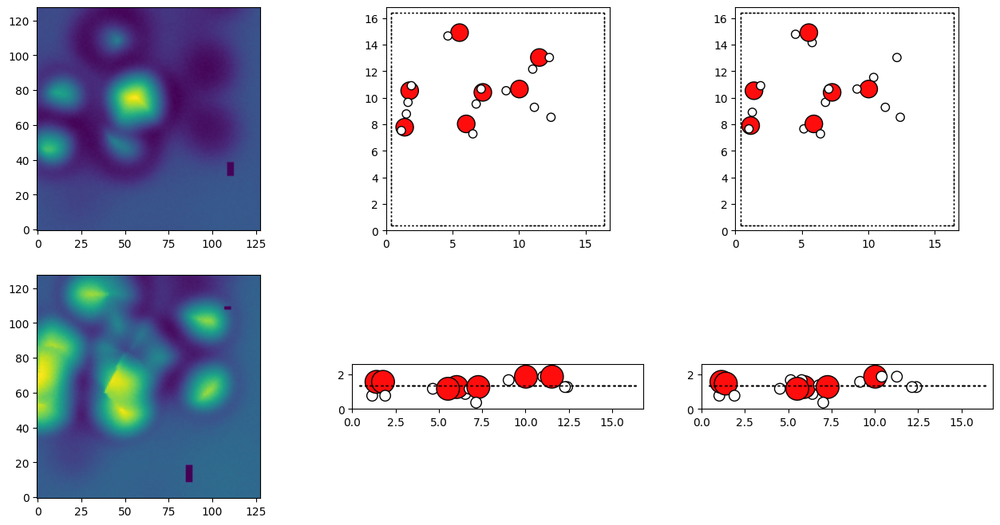

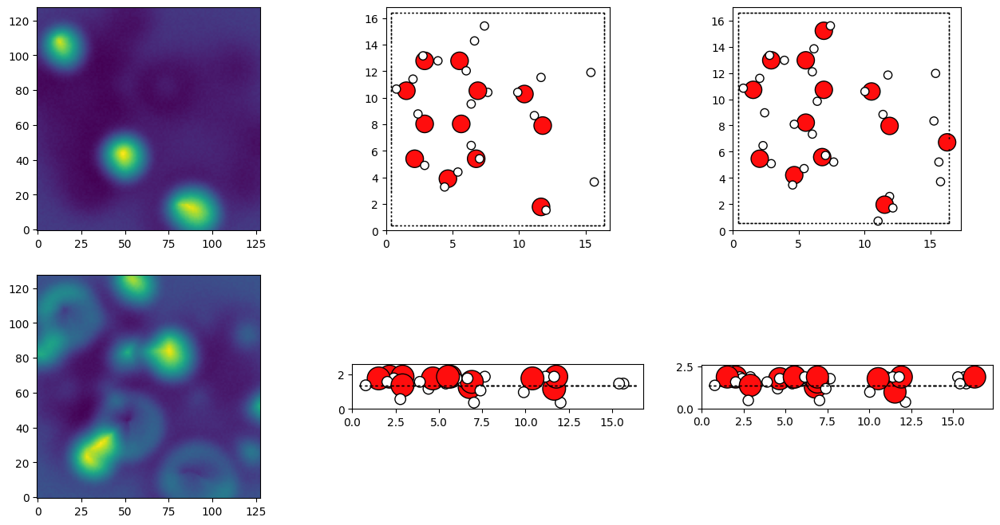

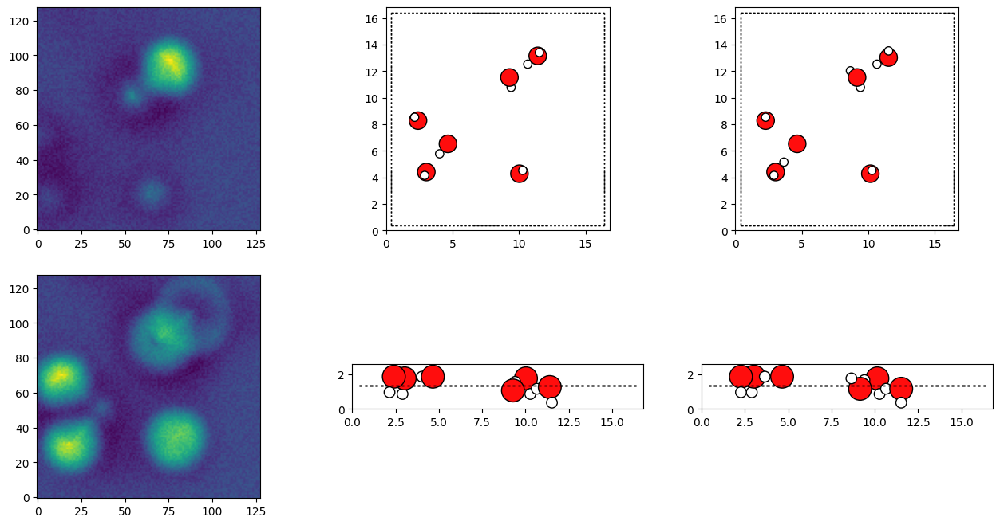

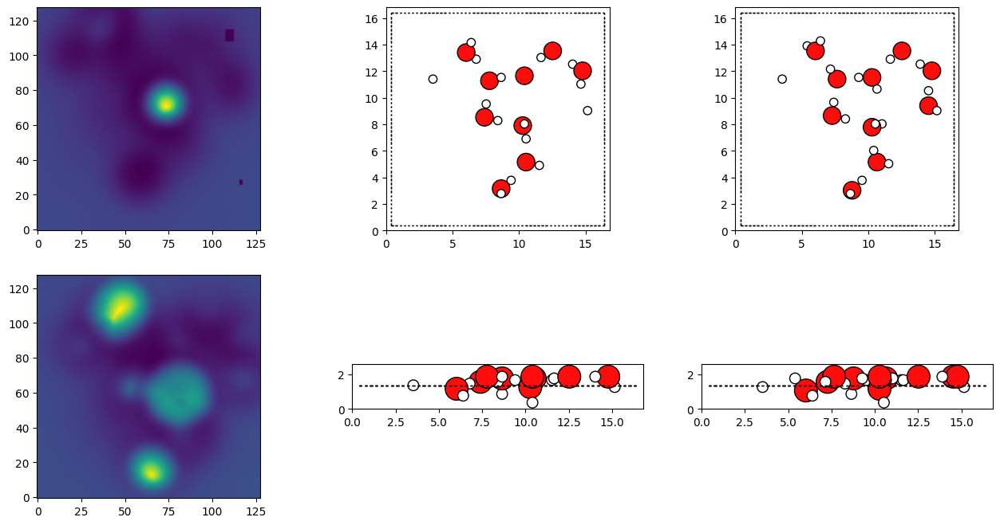

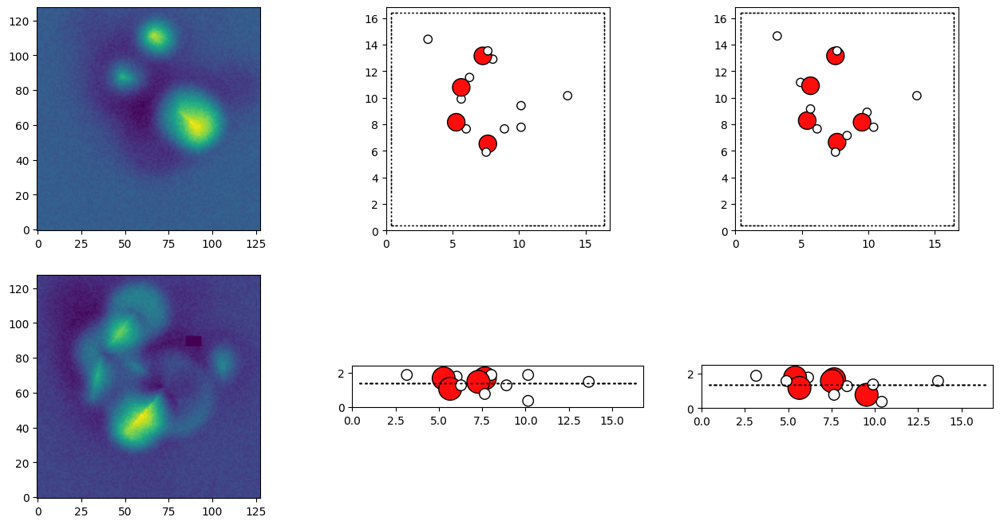

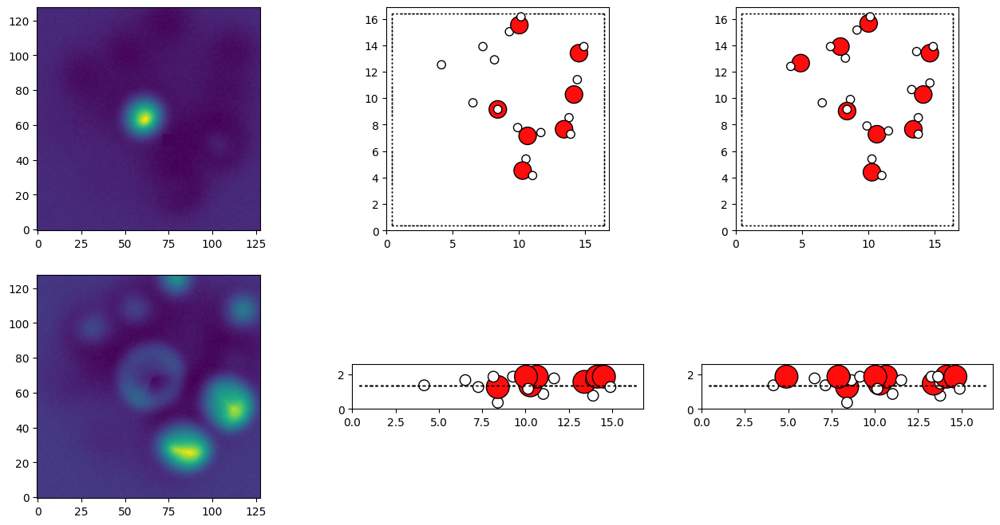

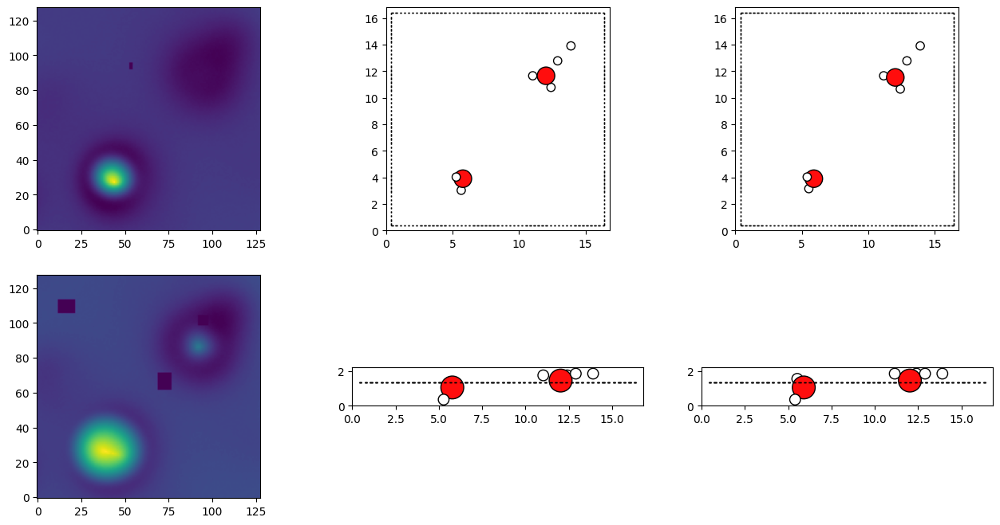

In [17]:
for i in range(inputs.shape[0]):
    pred_mol = grid_to_mol(preds[i])
    target_mol = grid_to_mol(targets[i])

    fig = plt.figure(figsize=(16, 8))
    ax = plt.subplot(2, 3, 1)
    ax.imshow(inputs[i, ..., 0, 0], origin='lower')
    ax = plt.subplot(2, 3, 4)
    ax.imshow(inputs[i, ..., -1, 0], origin='lower')

    ax = plt.subplot(2, 3, 2)
    plot_atoms(pred_mol, ax=ax)
    ax = plt.subplot(2, 3, 5)
    plot_atoms(pred_mol, ax=ax, rotation='90x')

    ax = plt.subplot(2, 3, 3)
    plot_atoms(target_mol, ax=ax)
    ax = plt.subplot(2, 3, 6)
    plot_atoms(target_mol, ax=ax, rotation='90x')

## Experimental predictions

In [8]:
from PIL import Image

def interpolate_and_crop(
    Xs: list[np.ndarray], real_dim: Tuple[int, int], target_res: float = 0.125, target_multiple: int = 8
) -> list[np.ndarray]:
    """
    Interpolate a batch of AFM images to target resolution and crop to a target multiple of pixels in the xy plane.

    Arguments:
        X: AFM images to interpolate and crop. Each array should be of shape ``(batch_size, x, y, z)``.
        real_dim: Real-space size of AFM image region in x- and y-directions in Ångstroms.
        target_res: Target size for a pixel in angstroms.
        target_multiple: Target multiple of pixels of output image.

    Returns:
        Interpolated and cropped AFM images.
    """

    resized_shape = (int(real_dim[1] // target_res), int(real_dim[0] // target_res))
    for k, x in enumerate(Xs):
        # Interpolate for correct resolution
        Xs_ = np.empty((x.shape[0], resized_shape[1], resized_shape[0], x.shape[-1]))
        for i in range(x.shape[0]):
            for j in range(x.shape[-1]):
                Xs_[i, :, :, j] = np.array(Image.fromarray(x[i, :, :, j]).resize(resized_shape, Image.BILINEAR))

        # Crop for correct multiple of pixels
        dx = resized_shape[1] % target_multiple
        x_start = int(np.floor(dx / 2))
        x_end = resized_shape[1] - int(np.ceil(dx / 2))

        dy = resized_shape[0] % target_multiple
        y_start = int(np.floor(dy / 2))
        y_end = resized_shape[0] - int(np.ceil(dy / 2))

        Xs[k] = Xs_[:, x_start:x_end, y_start:y_end]

    return Xs


In [13]:
folder = '/l/exp_data/Water/'

data = [
    np.load(
        os.path.join(folder, f),
        allow_pickle=True
    )
    for f in os.listdir(folder)
    if f.endswith(".npz")
]

cropped_images = []
for d in data:
    image = d['data'][None, ...]
    lx, ly = d["lengthX"], d["lengthY"]

    # Normalize the image to [0,1], each height channel separately
    image_max = image.max()
    image_min = image.min()
    image = (image - image_min) / (image_max - image_min)

    cropped_images.append(
        interpolate_and_crop([image], (lx, ly), target_res=0.125, target_multiple=32)[0].transpose(1, 2, 3, 0)
    )
    print(cropped_images[-1].shape)


(256, 256, 12, 1)
(192, 192, 9, 1)
(288, 288, 10, 1)
(192, 192, 21, 1)
(256, 256, 9, 1)
(320, 320, 11, 1)
(480, 480, 7, 1)
(320, 320, 9, 1)
(192, 192, 21, 1)
(256, 256, 9, 1)


In [14]:
preds = []
for i in range(len(cropped_images)):
    cr = cropped_images[i][None, ..., -8:, :]

    print(cr.shape)
    pred, attention = state.apply_fn(
        {'params': state.params, 'batch_stats': state.batch_stats},
        cr,
        training=False,
    )
    preds.append(pred)

(1, 256, 256, 8, 1)
(1, 192, 192, 8, 1)
(1, 288, 288, 8, 1)
(1, 192, 192, 8, 1)
(1, 256, 256, 8, 1)
(1, 320, 320, 8, 1)
(1, 480, 480, 7, 1)
(1, 320, 320, 8, 1)
(1, 192, 192, 8, 1)
(1, 256, 256, 8, 1)


<Figure size 1600x400 with 0 Axes>

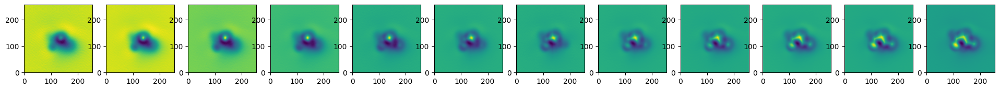

<Figure size 1600x400 with 0 Axes>

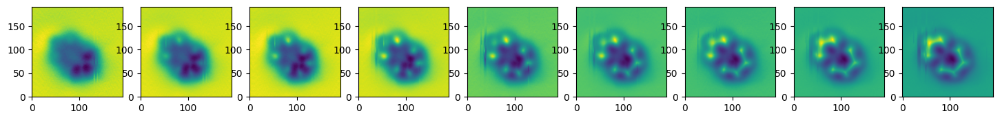

<Figure size 1600x400 with 0 Axes>

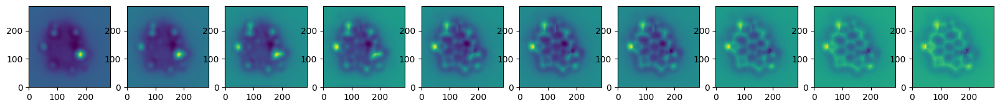

<Figure size 1600x400 with 0 Axes>

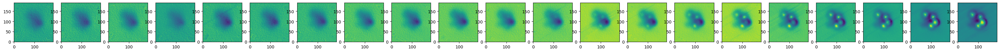

<Figure size 1600x400 with 0 Axes>

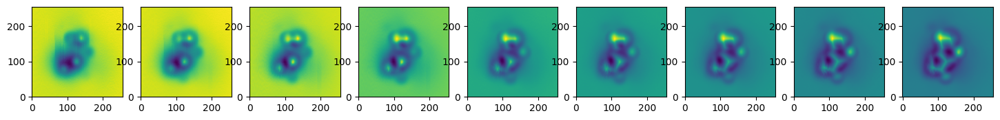

<Figure size 1600x400 with 0 Axes>

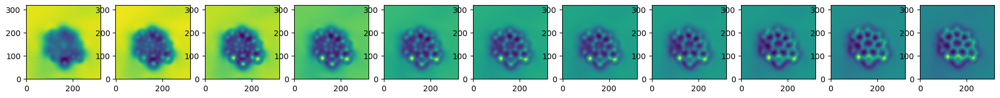

<Figure size 1600x400 with 0 Axes>

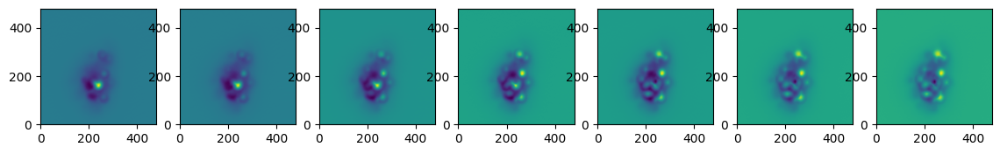

<Figure size 1600x400 with 0 Axes>

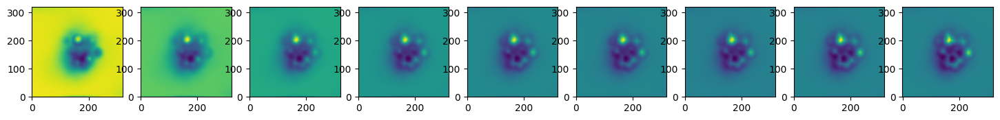

<Figure size 1600x400 with 0 Axes>

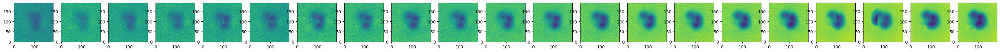

<Figure size 1600x400 with 0 Axes>

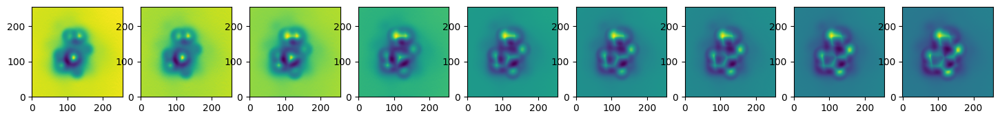

In [17]:
# Plot experimental inputs
for i in range(len(cropped_images)):
    fig = plt.figure(figsize=(16, 4))
    image = cropped_images[i]
    heights = image.shape[-2]
        
    fig = plt.figure(figsize=(heights*2, 4))
    for z in range(heights):
        ax = plt.subplot(1, heights, z+1)
        im = ax.imshow(image[..., z, 0], origin='lower')
        #plt.colorbar(im, ax=ax)


In [ ]:
# Plot predictions, first row is H, second row is O, third row is sum, fourth row is input

for i in range(len(preds)):
    pred = preds[i]
    fig = plt.figure(figsize=(16, 4))
    heights = pred.shape[-2]

    for z in range(heights):
        ax = plt.subplot(4, heights, z+1)
        ax.imshow(pred[0, ..., z, 0], origin='lower')

        ax = plt.subplot(4, heights, z+heights+1)
        ax.imshow(pred[0, ..., z, 1], origin='lower')

        ax = plt.subplot(4, heights, z+2*heights+1)
        ax.imshow(pred[0, ..., z, :].sum(axis=-1), origin='lower')

        ax = plt.subplot(4, heights, z+3*heights+1)
        im = ax.imshow(cropped_images[i][..., -1-z, 0], origin='lower')
        plt.colorbar(im, ax=ax)

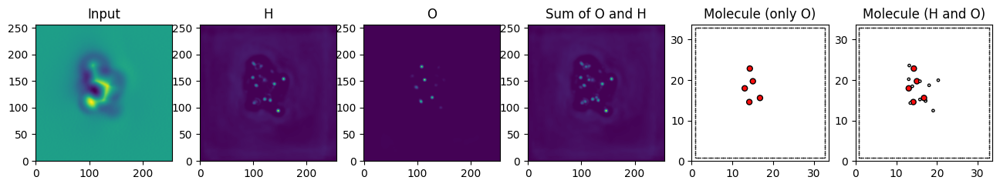

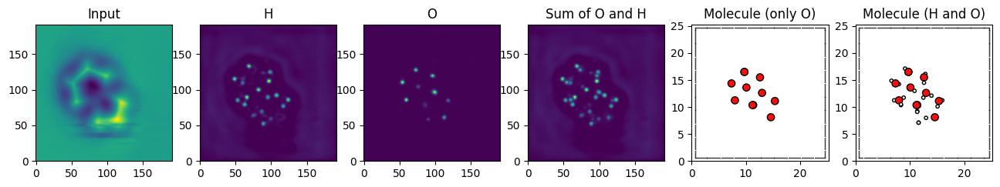

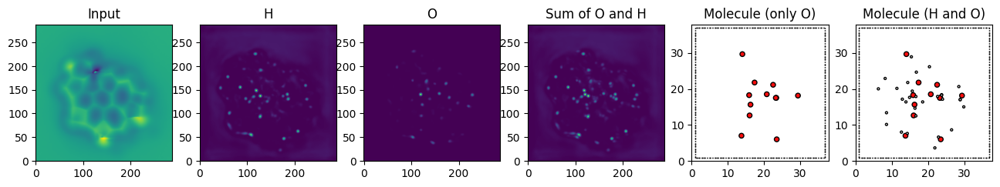

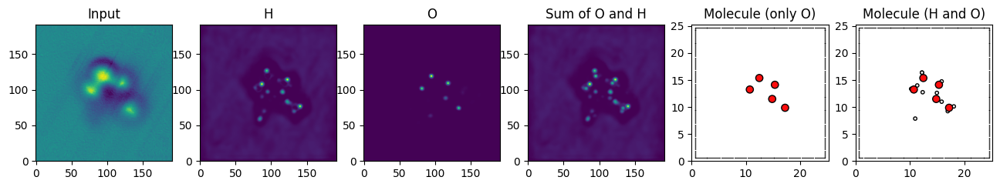

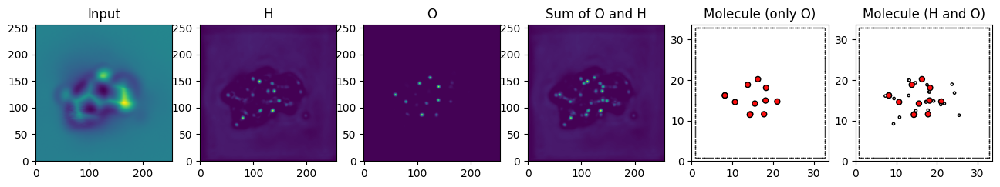

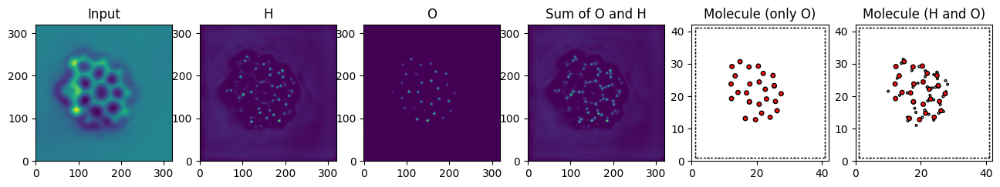

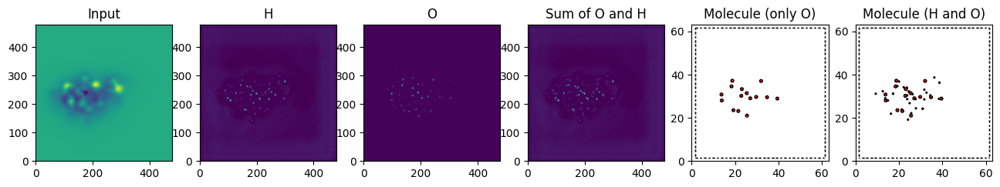

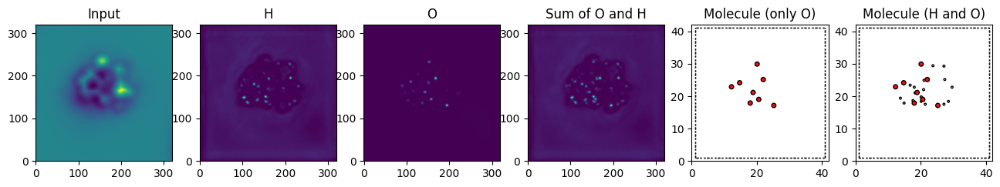

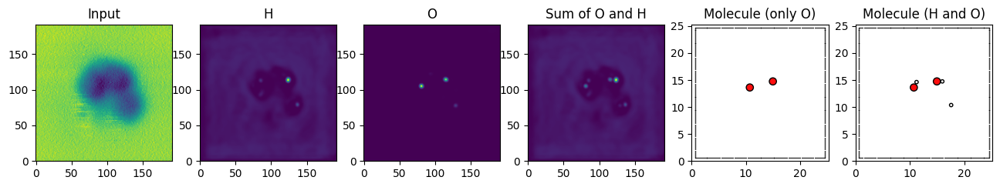

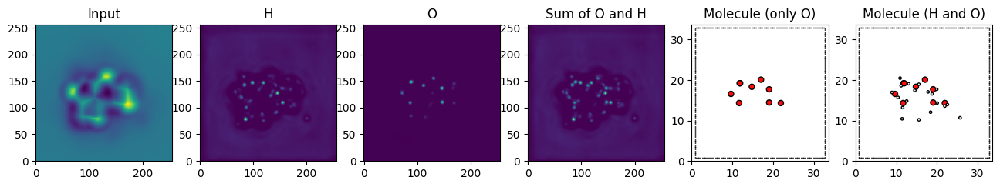

In [16]:
# Plot predictions, 
# first column is input close, 
# 2nd is sum of H, 
# 3rd is sum of O, 
# 4th is sum of all, 
# 5th is grid_to_mol output from top

for i in range(len(preds)):
    pred = preds[i]
    fig = plt.figure(figsize=(16, 4))
    heights = pred.shape[-2]

    mol_o, mol_h, full_molecule = grid_to_mol_v2(pred[0], peak_threshold=0.3)
    for mol in (mol_o, mol_h, full_molecule):
        mol.cell = (
            cropped_images[i].shape[0] * 0.125,
            cropped_images[i].shape[1] * 0.125,
            1.0
        )

    ax = plt.subplot(1, 6, 1)
    ax.imshow(cropped_images[i][..., -1, 0].T, origin='lower')
    ax.set_title("Input")

    ax = plt.subplot(1, 6, 2)
    ax.imshow(pred[0, ..., :, 0].sum(axis=-1).T, origin='lower')
    ax.set_title("H")

    ax = plt.subplot(1, 6, 3)
    ax.imshow(pred[0, ..., :, 1].sum(axis=-1).T, origin='lower')
    ax.set_title("O")

    ax = plt.subplot(1, 6, 4)
    ax.imshow(pred[0].sum(axis=-1).sum(axis=-1).T, origin='lower')
    ax.set_title("Sum of O and H")

    ax = plt.subplot(1, 6, 5)
    plot_atoms(mol_o, ax=ax)
    ax.set_title("Molecule (only O)")

    ax = plt.subplot(1, 6, 6)
    plot_atoms(full_molecule, ax=ax)
    ax.set_title("Molecule (H and O)")